<a href="https://colab.research.google.com/github/atonendeley/CE880-Data-Science/blob/main/Assignment/Project%20Abalone/CE880_Abalone_Project_Assignment_06012022_v2_2_.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

**Atonye Endeley 2103195 Abalone Project Assignment Part 2 Combined Multi-Ouput Model Regression and Classification Multi Layer Neural Network**

Import Libraries


In [65]:
%matplotlib inline
import matplotlib.pyplot as plt

In [66]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d  import Axes3D
from pandas_profiling import ProfileReport

from sklearn.linear_model import Ridge
from sklearn.linear_model import Lasso
from sklearn.metrics import accuracy_score

from numpy import argmax

from sklearn.metrics import mean_absolute_error

from sklearn.linear_model import LinearRegression
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import RepeatedStratifiedKFold
from sklearn.preprocessing import StandardScaler

from tensorflow.keras.layers import Dense
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Input
from tensorflow.keras.utils import plot_model

from sklearn.ensemble import  RandomForestRegressor
from sklearn.ensemble import BaggingRegressor

import lightgbm as lgb
from numpy import unique

from sklearn.metrics import mean_squared_error
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder

import warnings
warnings.filterwarnings('ignore')
from sklearn.model_selection import RandomizedSearchCV
import tensorflow as tf
from keras.models import Sequential,model_from_json
from tensorflow.keras.optimizers import RMSprop
from tensorflow.keras import optimizers

from tensorflow.keras import layers
from tensorflow.keras import models
from tensorflow.keras import losses
from tensorflow.keras import callbacks

Import data



In [67]:
data = pd.read_csv('abalone.csv')

In [68]:
data.head()

,Sex,Length,Diameter,Height,Whole weight,Shucked weight,Viscera weight,Shell weight,Rings
0,M,0.455,0.365,0.095,0.5140,0.2245,0.1010,0.150,15
1,M,0.350,0.265,0.090,0.2255,0.0995,0.0485,0.070,7
2,F,0.530,0.420,0.135,0.6770,0.2565,0.1415,0.210,9
3,M,0.440,0.365,0.125,0.5160,0.2155,0.1140,0.155,10
4,I,0.330,0.255,0.080,0.2050,0.0895,0.0395,0.055,7


In [ ]:
pip install https://github.com/pandas-profiling/pandas-profiling/archive/master.zip


  Using cached https://github.com/pandas-profiling/pandas-profiling/archive/master.zip


In [ ]:
profile = ProfileReport(data, title='Pandas Profiling Report', html ={'style':{'full_width': False}})


In [ ]:
profile.to_notebook_iframe()


Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [ ]:
profile = ProfileReport(data)
profile



Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [ ]:
profile.to_file(output_file="Report.html")


Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

In [ ]:
! ls

abalone.csv  Report.html  sample_data


In [ ]:
! cat Report.html

cat: Report.html: No such file or directory


Exploratory Data Analysis

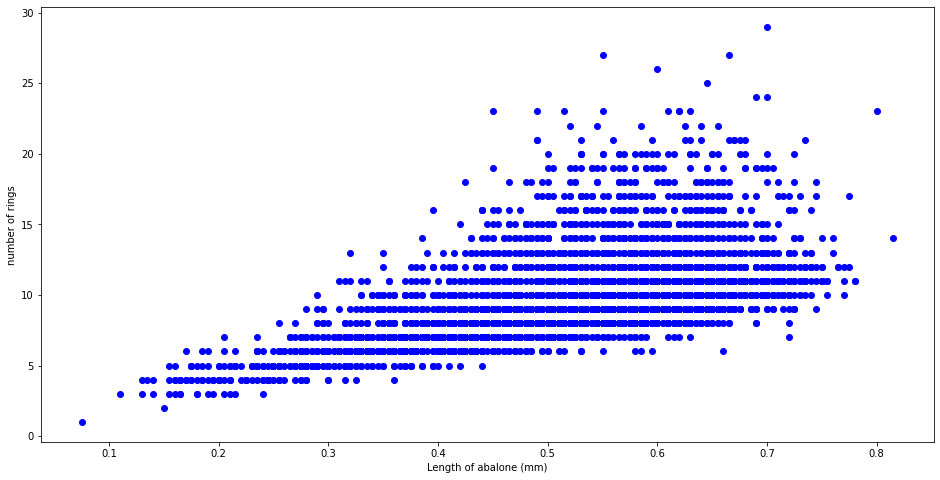

In [ ]:
plt.figure(figsize=(16,8))
plt.scatter(data['Length'], data['Rings'],c='blue')
plt.xlabel('Length of abalone (mm)')
plt.ylabel('number of rings')
plt.show()

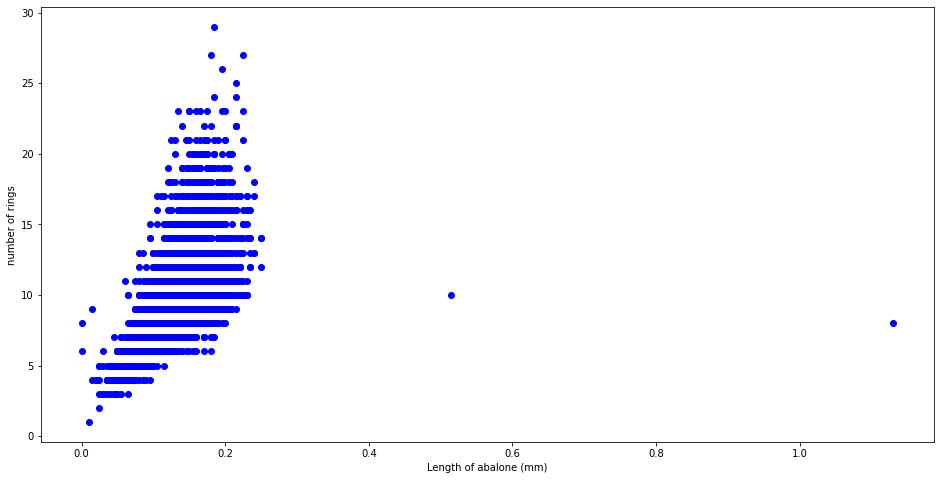

In [ ]:
plt.figure(figsize=(16,8))
plt.scatter(data['Height'], data['Rings'],c='blue')
plt.xlabel('Length of abalone (mm)')
plt.ylabel('number of rings')
plt.show()

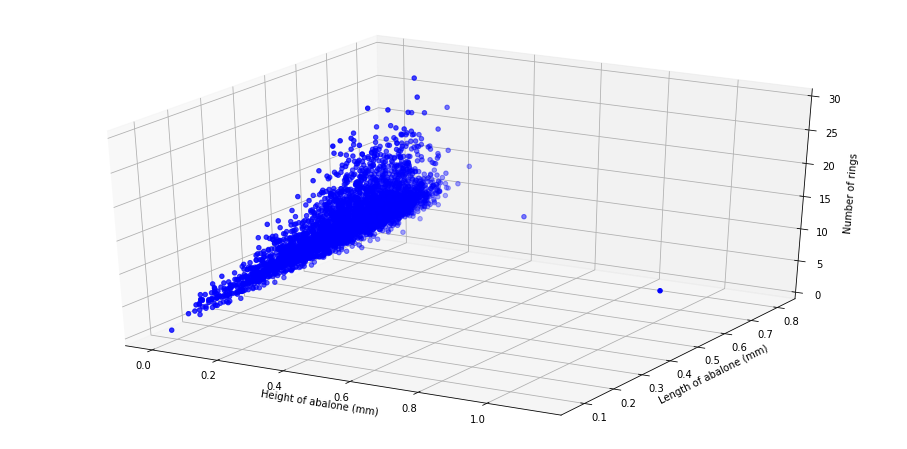

In [ ]:
fig = plt.figure(figsize=(16,8))
ax = plt.axes(projection='3d')

ax.set_xlabel('Height of abalone (mm)')
ax.set_ylabel('Length of abalone (mm)')
ax.set_zlabel('Number of rings')
ax.scatter3D(data['Height'], data['Length'], data['Rings'], c='blue');

plt.show()

Hot Encoding

In [69]:
data = data.values

In [70]:
# split into input (X) and output (y) variables
X, y = data[:, 1:-1], data[:, -1]
X, y = X.astype('float'), y.astype('float')
n_features = X.shape[1]

In [71]:
# split data into train and test sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.33, random_state=1)

In [72]:
# encode strings to integer
y_class = LabelEncoder().fit_transform(y)
n_class = len(unique(y_class))

In [73]:
 #split data into train and test sets
X_train, X_test, y_train, y_test, y_train_class, y_test_class = train_test_split(X, y, y_class, test_size=0.33, random_state=1)

In [75]:
# input
visible = Input(shape=(n_features,))
hidden1 = Dense(20, activation='relu', kernel_initializer='he_normal')(visible)
hidden2 = Dense(10, activation='relu', kernel_initializer='he_normal')(hidden1)

In [76]:
# regression output
out_reg = Dense(1, activation='linear')(hidden2)

In [77]:
# classification output
out_clas = Dense(n_class, activation='softmax')(hidden2)

In [78]:
# define model
model = Model(inputs=visible, outputs=[out_reg, out_clas])

In [79]:
# compile the keras model
model.compile(loss=['mse','sparse_categorical_crossentropy'], optimizer='adam')

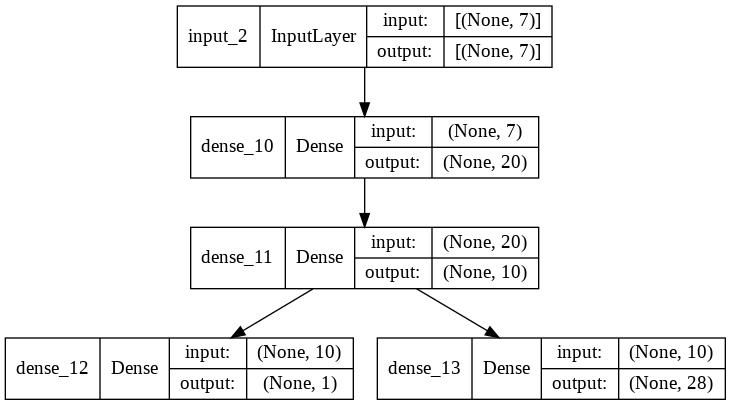

In [80]:
# plot graph of model
plot_model(model, to_file='model.png', show_shapes=True)

In [81]:
# fit the keras model on the dataset
model.fit(X_train, [y_train,y_train_class], epochs=150, batch_size=32, verbose=2)

Epoch 1/150
88/88 - 1s - loss: 103.4400 - dense_12_loss: 100.1680 - dense_13_loss: 3.2720 - 737ms/epoch - 8ms/step
Epoch 2/150
88/88 - 0s - loss: 75.4537 - dense_12_loss: 72.4636 - dense_13_loss: 2.9901 - 119ms/epoch - 1ms/step
Epoch 3/150
88/88 - 0s - loss: 40.8671 - dense_12_loss: 38.1428 - dense_13_loss: 2.7244 - 129ms/epoch - 1ms/step
Epoch 4/150
88/88 - 0s - loss: 17.7528 - dense_12_loss: 15.1620 - dense_13_loss: 2.5908 - 127ms/epoch - 1ms/step
Epoch 5/150
88/88 - 0s - loss: 12.2942 - dense_12_loss: 9.7417 - dense_13_loss: 2.5525 - 132ms/epoch - 1ms/step
Epoch 6/150
88/88 - 0s - loss: 11.7594 - dense_12_loss: 9.2303 - dense_13_loss: 2.5291 - 131ms/epoch - 1ms/step
Epoch 7/150
88/88 - 0s - loss: 11.4829 - dense_12_loss: 8.9680 - dense_13_loss: 2.5149 - 123ms/epoch - 1ms/step
Epoch 8/150
88/88 - 0s - loss: 11.2167 - dense_12_loss: 8.7133 - dense_13_loss: 2.5034 - 124ms/epoch - 1ms/step
Epoch 9/150
88/88 - 0s - loss: 10.9651 - dense_12_loss: 8.4713 - dense_13_loss: 2.4938 - 128ms/epo

In [82]:
# make predictions on test set
y_hat1, y_hat2 = model.predict(X_test)

In [83]:
# calculate error for regression model
error = mean_absolute_error(y_test, y_hat1)
print('MAE: %.3f' % error)

MAE: 1.579


In [84]:
# evaluate accuracy for classification model
y_hat2 = argmax(y_hat2, axis=-1).astype('int')
acc = accuracy_score(y_test_class, y_hat2)
print('Accuracy: %.3f' % acc)

Accuracy: 0.264
